# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [34]:
merlin_output_folder = r'I:\MERFISH_Analysis\20221003-hMTG_hM1'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: I:\MERFISH_Analysis\20221003-hMTG_hM1\PostAnalysis


In [35]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Create figure_folder: I:\MERFISH_Analysis\20221003-hMTG_hM1\PostAnalysis\Figures


## Load metadata

In [36]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,101225696192426817123371102434278594702,0,113.269926,5804.723904,3666.310051,5801.473104,5807.974704,3663.761251,3668.858851
1,101397509189848695069538528034051771588,0,611.177185,5875.247906,3757.138054,5869.297106,5881.198706,3752.105254,3762.170854
2,109798978951099244377695836653369623030,0,5.969752,5858.021905,3634.936051,5856.553105,5859.490706,3631.361250,3638.510851
3,112021593975793307237716879747158608658,0,734.964658,5742.569902,3713.560053,5737.321102,5747.818703,3708.365252,3718.754853
4,112695574324456641951538194044616611627,0,613.754230,5819.735904,3707.836052,5815.405104,5824.066705,3702.101252,3713.570853
...,...,...,...,...,...,...,...,...,...
20497,79848220232110570169029339112006419804,294,979.707933,5651.847826,3226.169904,5645.141025,5658.554626,3219.247104,3233.092704
20498,83256084935006143573981531572389932983,294,376.746286,5788.953829,3321.641906,5784.893029,5793.014629,3317.203106,3326.080707
20499,85099544543830364772477253180701263854,294,2244.053289,5807.637830,3336.005907,5800.661029,5814.614630,3325.735107,3346.276707
20500,88498179755309968090778091480450439783,294,36.476479,5714.109827,3361.763907,5712.641027,5715.578627,3359.215107,3364.312708


In [37]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [38]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

,CD52,PTPRU,MARCKSL1,RSPO1,POU3F1,RAB3B,ROR1,PTGER3,SLC44A5,ST6GALNAC5,...,SYNE2,IFI27,CDH11,ZFHX3,VAT1L,EPN2,NPTX1,ZNF536,KIAA1755,PCDH11X
index,,,,,,,,,,,,,,,,,,,,,
101225696192426817123371102434278594702,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
101397509189848695069538528034051771588,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
109798978951099244377695836653369623030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112021593975793307237716879747158608658,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112695574324456641951538194044616611627,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848220232110570169029339112006419804,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
83256084935006143573981531572389932983,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85099544543830364772477253180701263854,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [39]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

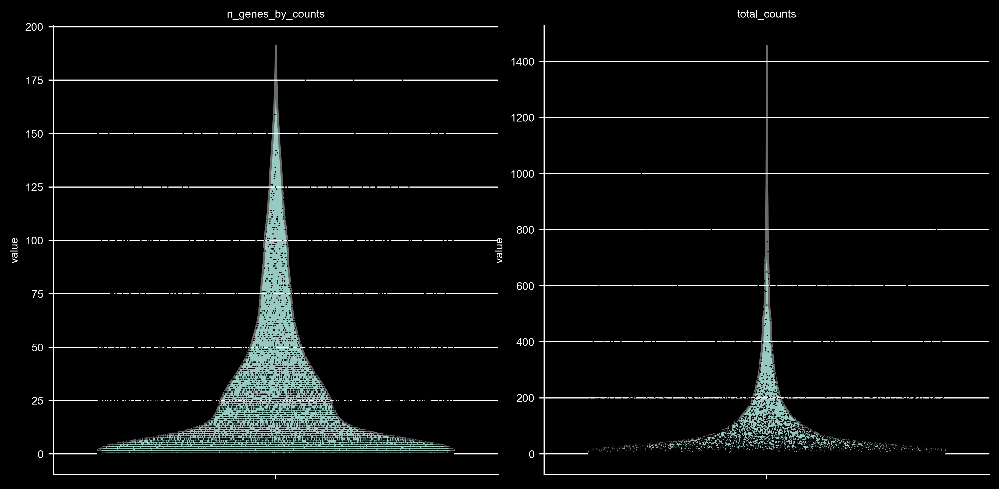

In [40]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

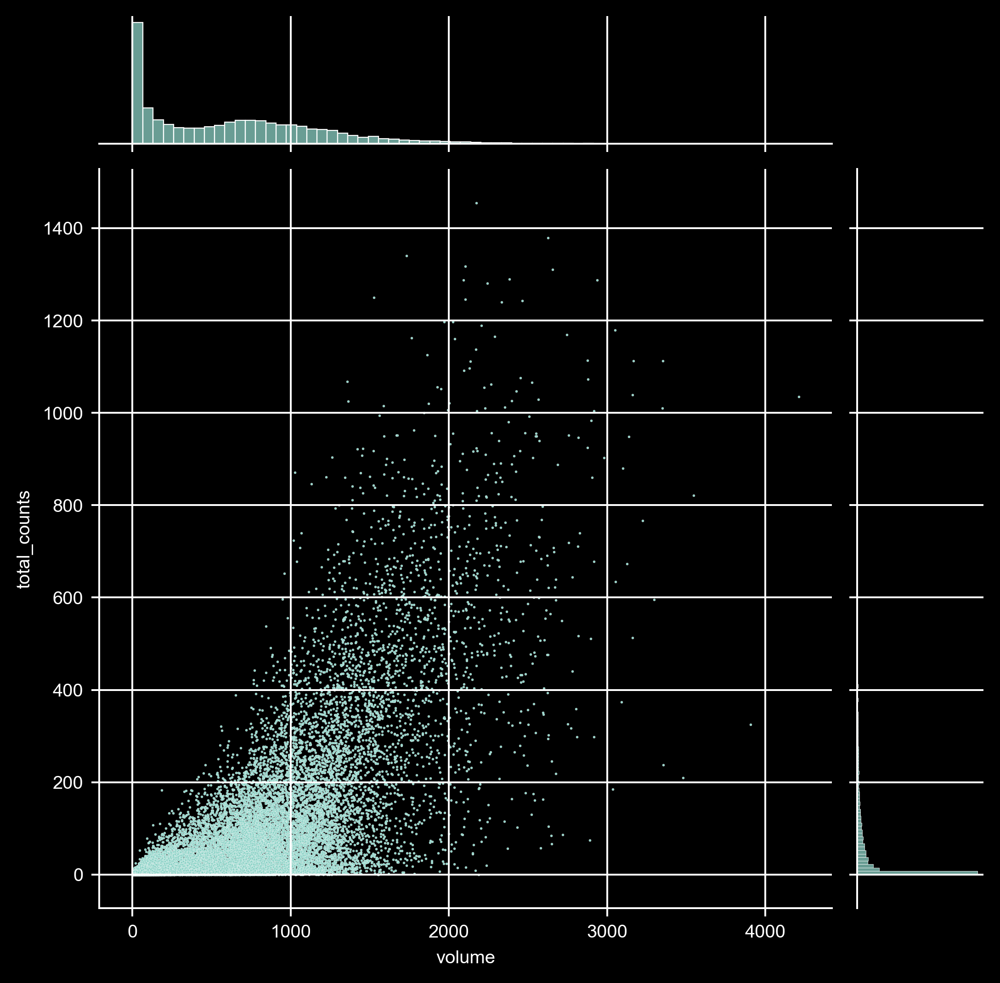

In [43]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts', s=1,)

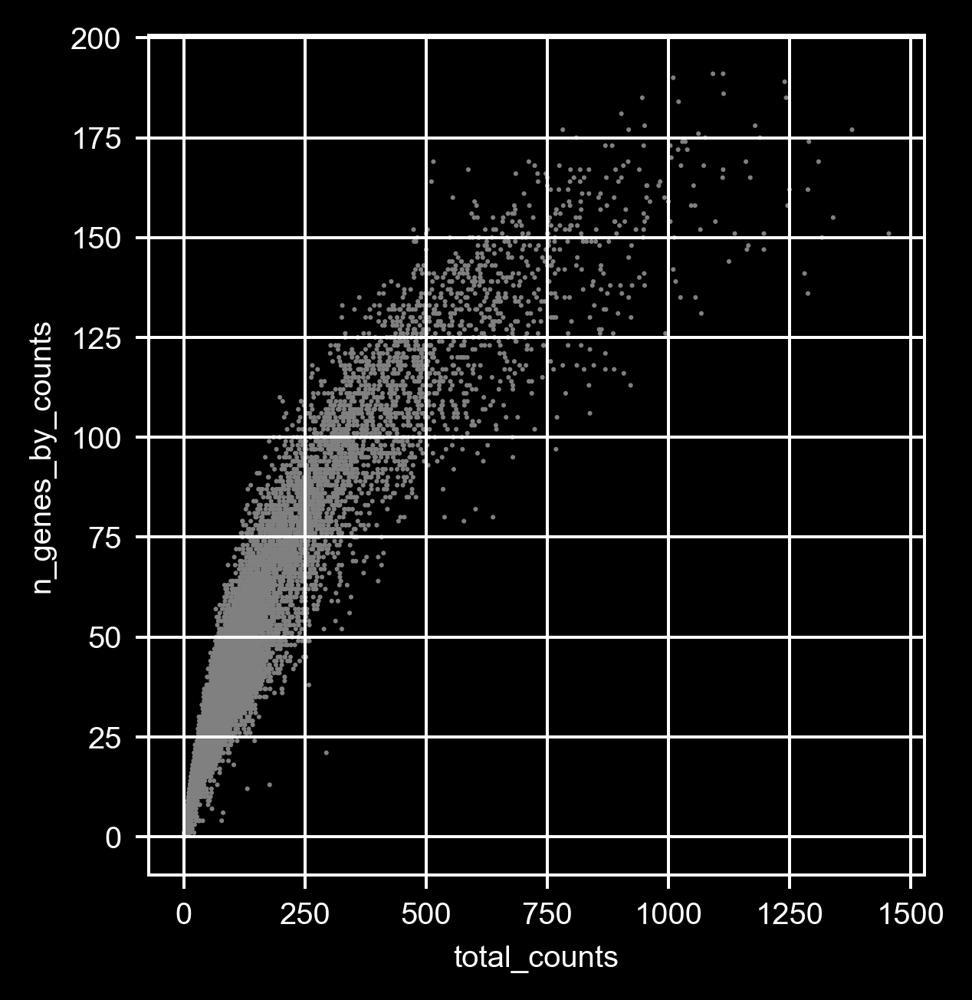

In [44]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [45]:
gene_count_threshold = 10
total_count_threshold = 10
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.5211198907423666 10684


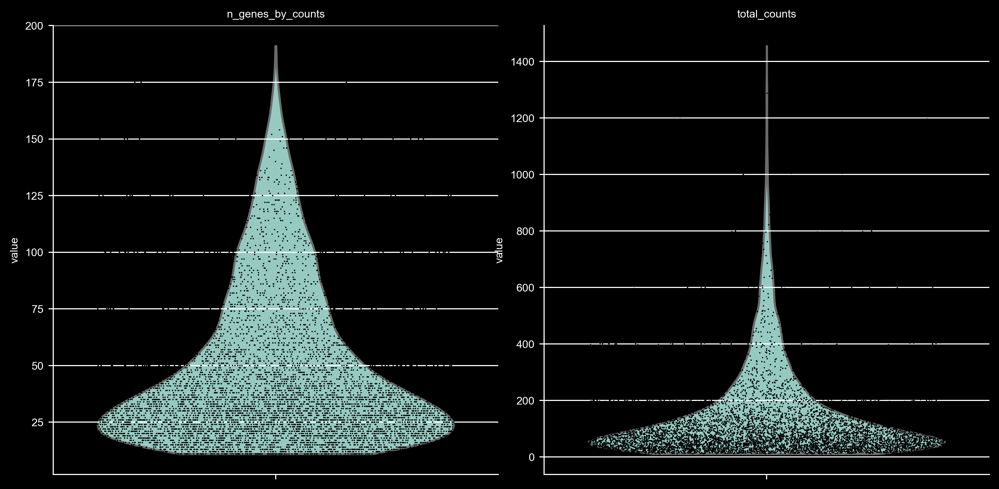

In [46]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


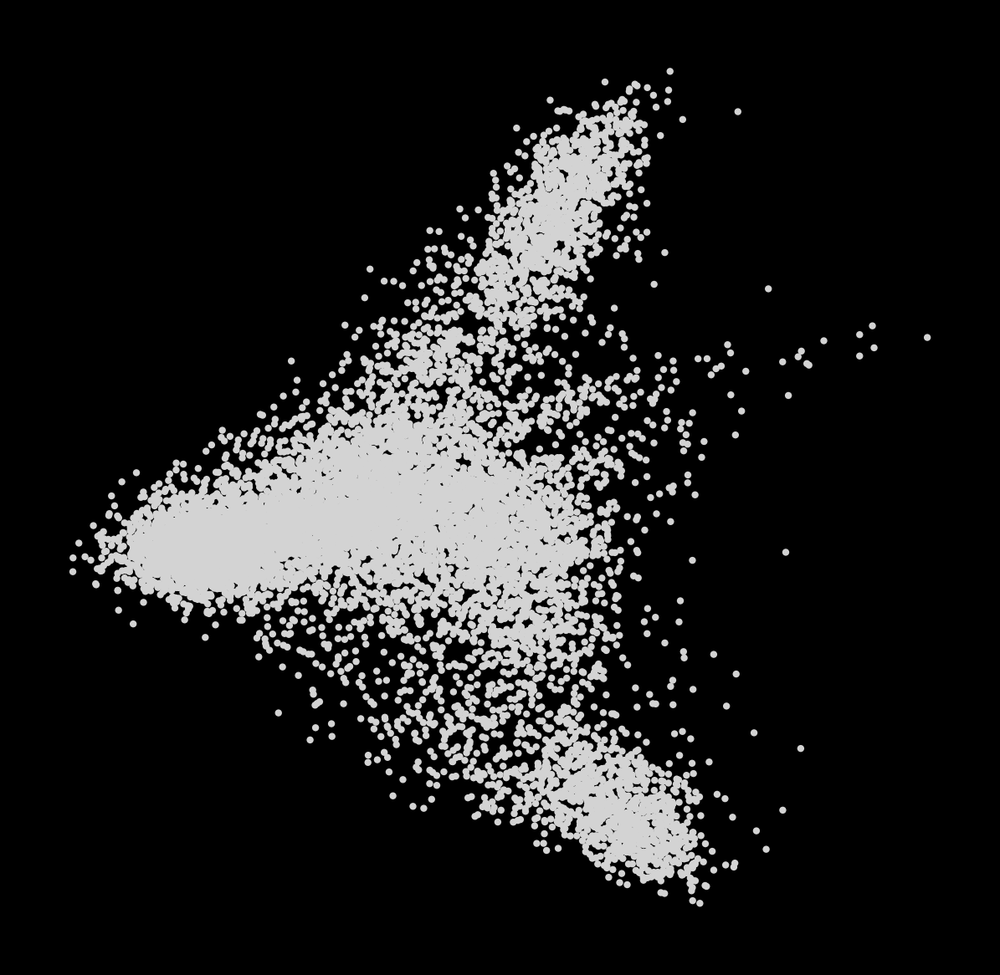

Wall time: 58.3 s


In [47]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [48]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=30)

Wall time: 12.4 s


In [53]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=0.5)

Wall time: 525 ms


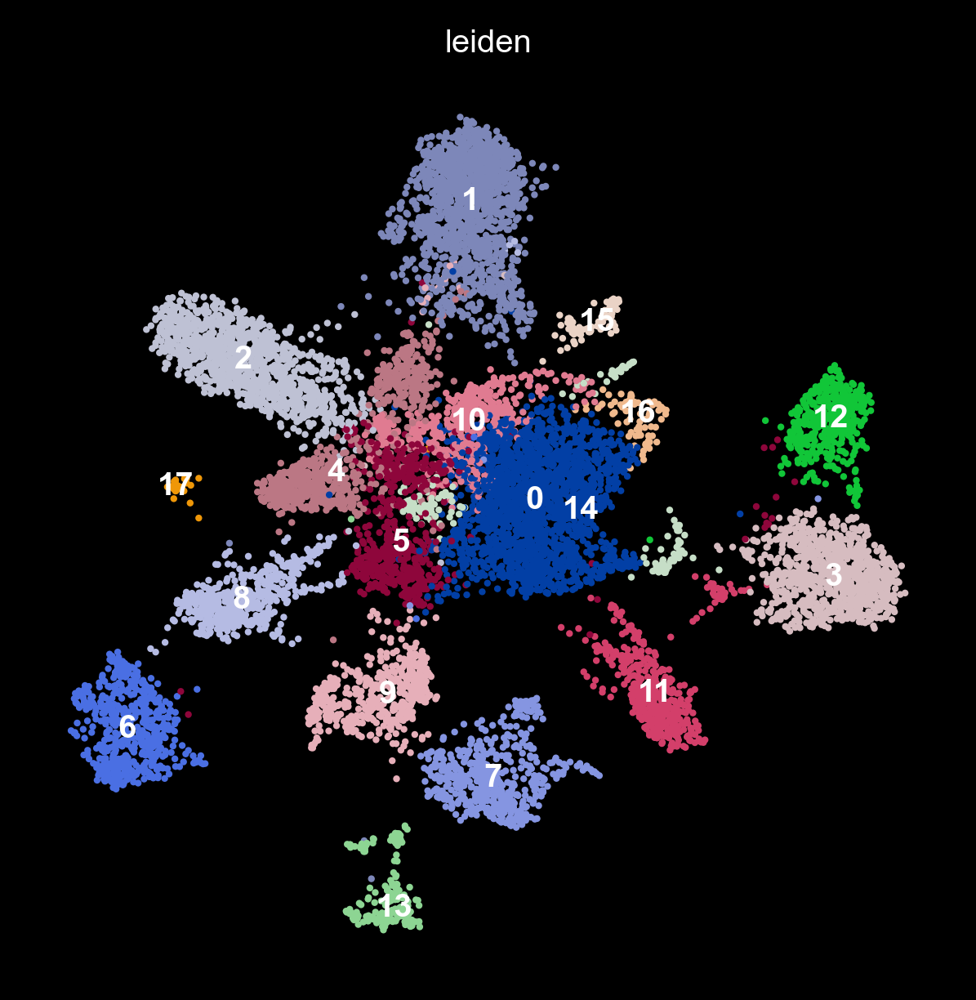

Wall time: 8.18 s


In [54]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

## 5. Check count for each cell for genes of interest

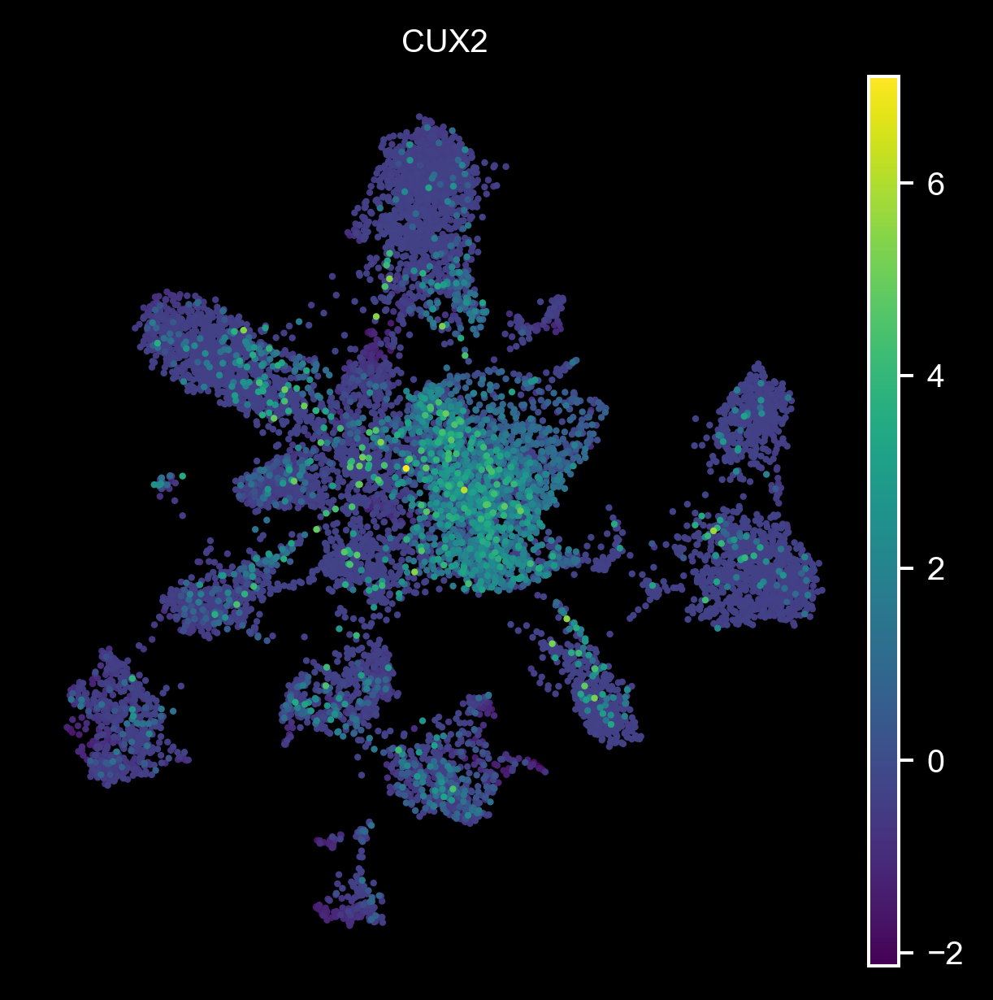

In [78]:
sc.pl.umap(adata, color='CUX2')

In [76]:
adata.var.loc['CUX2']

n_cells_by_counts        3.018000e+03
mean_counts              4.295191e-01
pct_dropout_by_counts    8.527948e+01
total_counts             8.806000e+03
mean                     1.970038e-10
std                      3.763009e-01
Name: CUX2, dtype: float64

In [77]:
adata

AnnData object with n_obs × n_vars = 10684 × 260
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'n_genes_by_counts', 'total_counts', 'leiden', 'leiden_cluster'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'leiden_cluster_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [71]:

# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                hue='CUX2', hue_norm=LogNorm(), s=1, linewidth=0,
                     legend=False, )
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])


ValueError: Could not interpret value `CUX2` for parameter `hue`

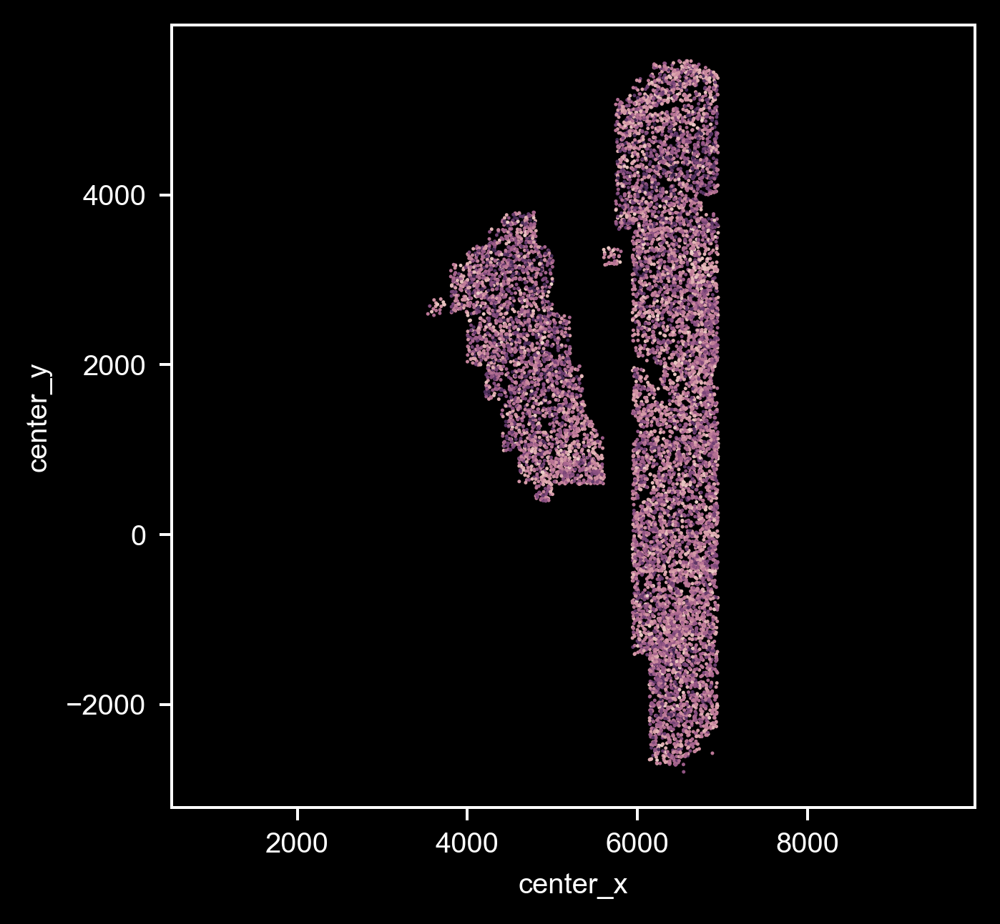

In [58]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                hue='total_counts', hue_norm=LogNorm(), s=1, linewidth=0,
                     legend=False, )
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])

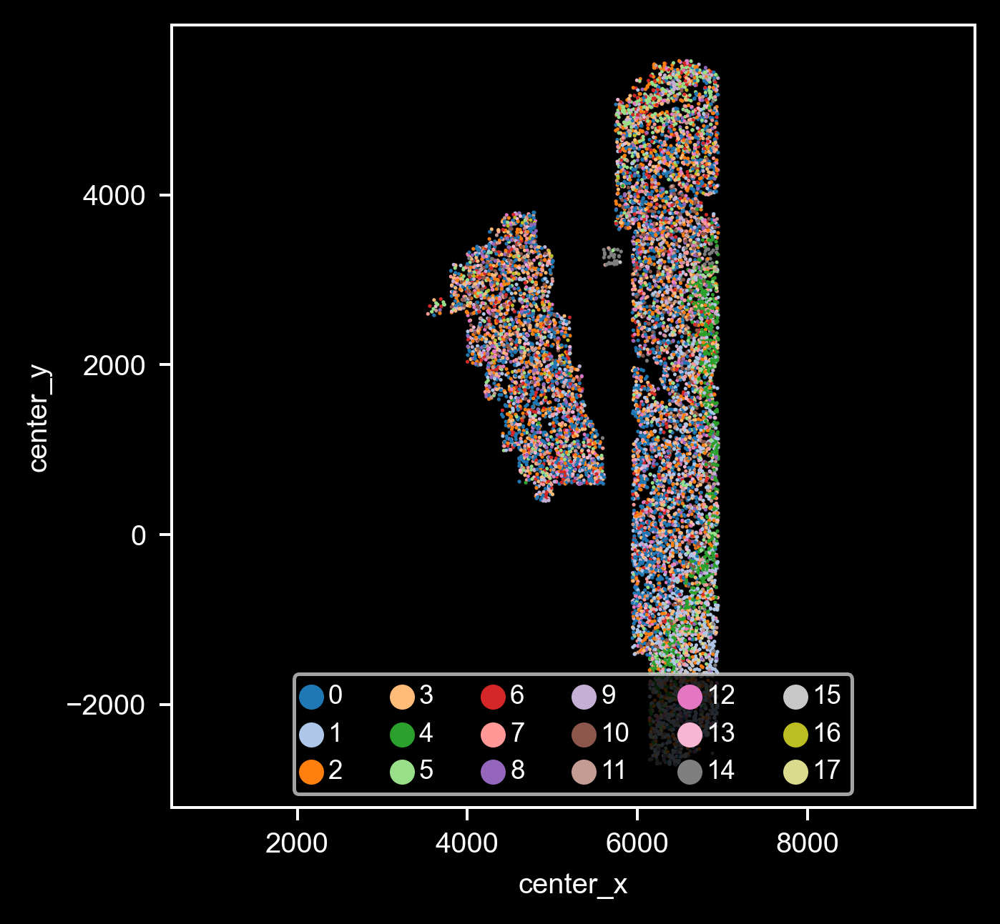

In [62]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = np.unique(adata.obs['leiden'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.1, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden', s=1, legend=True, linewidth=0)
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
#plt.savefig(os.path.join(figure_folder, 'spatial_sel_clusters.png'), transparent=True)

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

In [63]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

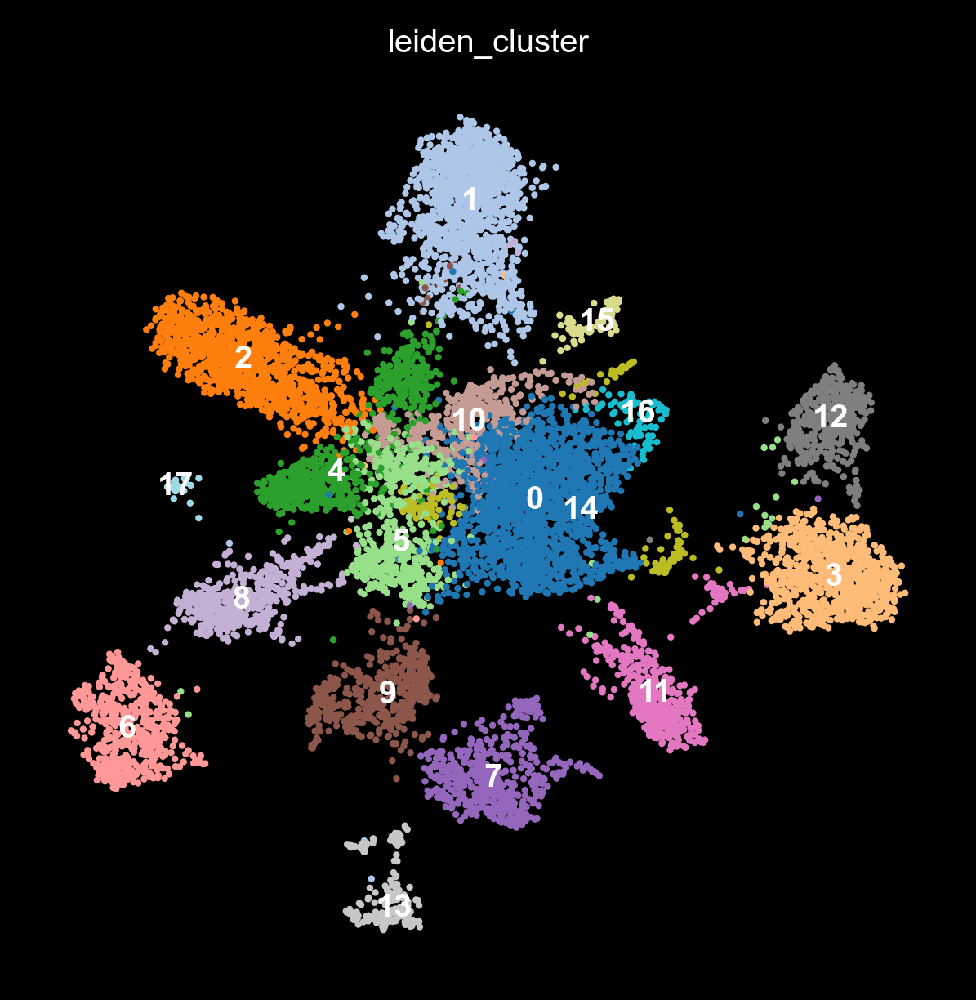

In [64]:
plt.style.use('dark_background')

sc.pl.umap(adata, color='leiden_cluster', 
           legend_loc='on data',
           palette='tab20',
           save='_dark_cluster.png',
           )

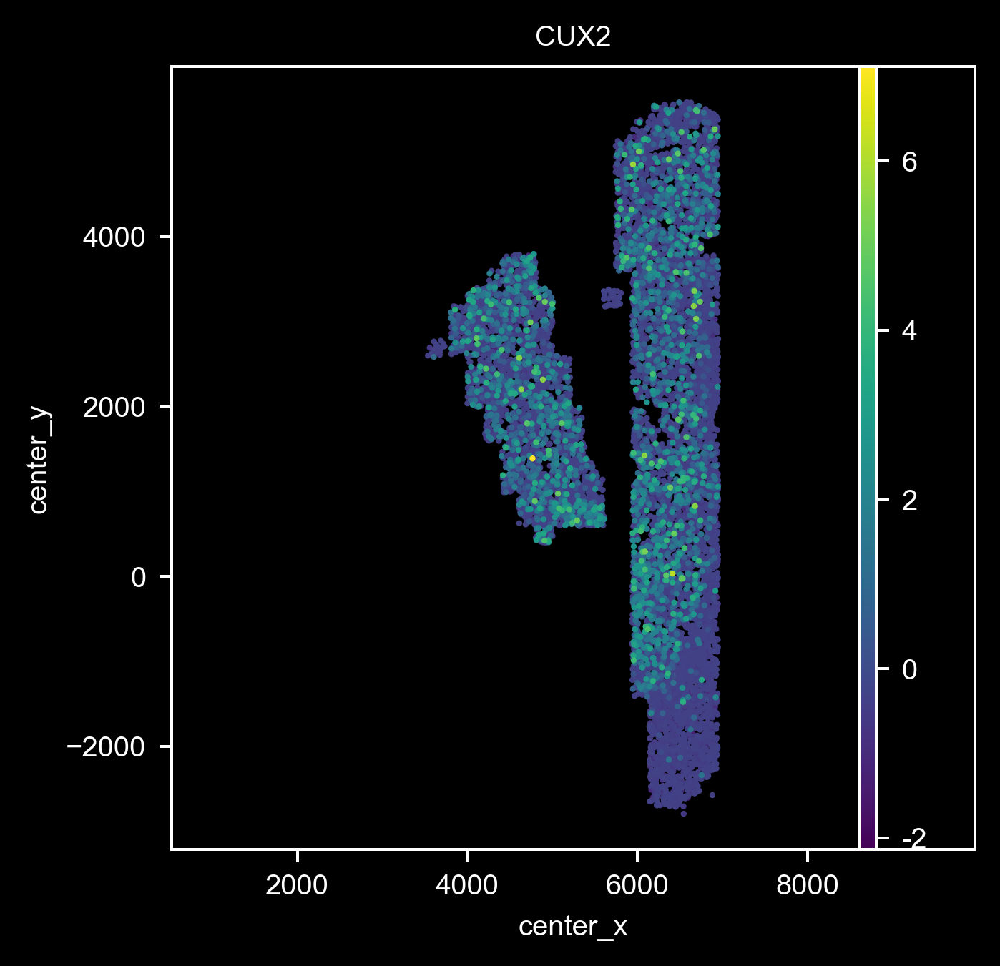

In [90]:
fig, ax = plt.subplots()
ax.grid(False)
plt.axis('equal')

sc.pl.scatter(adata, x='center_x', y='center_y', color='CUX2', ax=ax,)

plt.show()

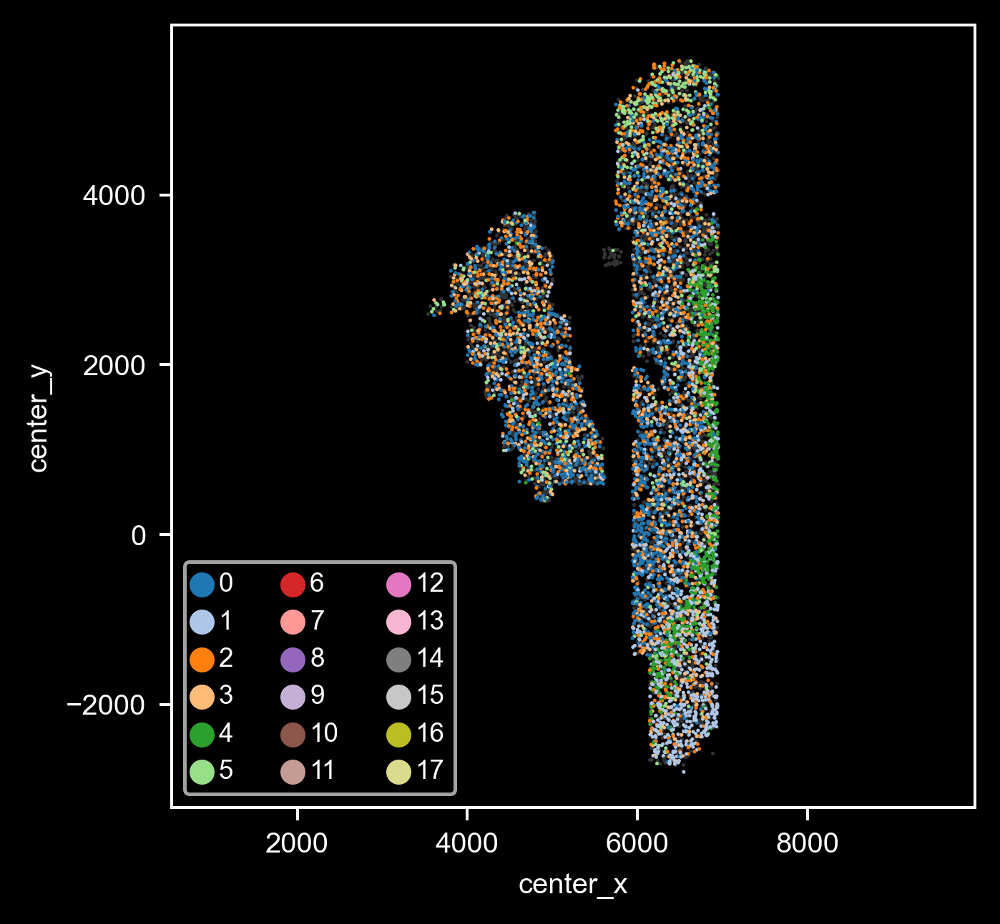

In [94]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
sel_clusters = ['0', '1', '2', '3', '4', '5']
#sel_clusters = np.unique(adata.obs['leiden_cluster'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.1, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=1, legend=True, linewidth=0)
ax.grid(False)
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
#plt.savefig(os.path.join(figure_folder, 'spatial_sel_clusters.png'), transparent=True)

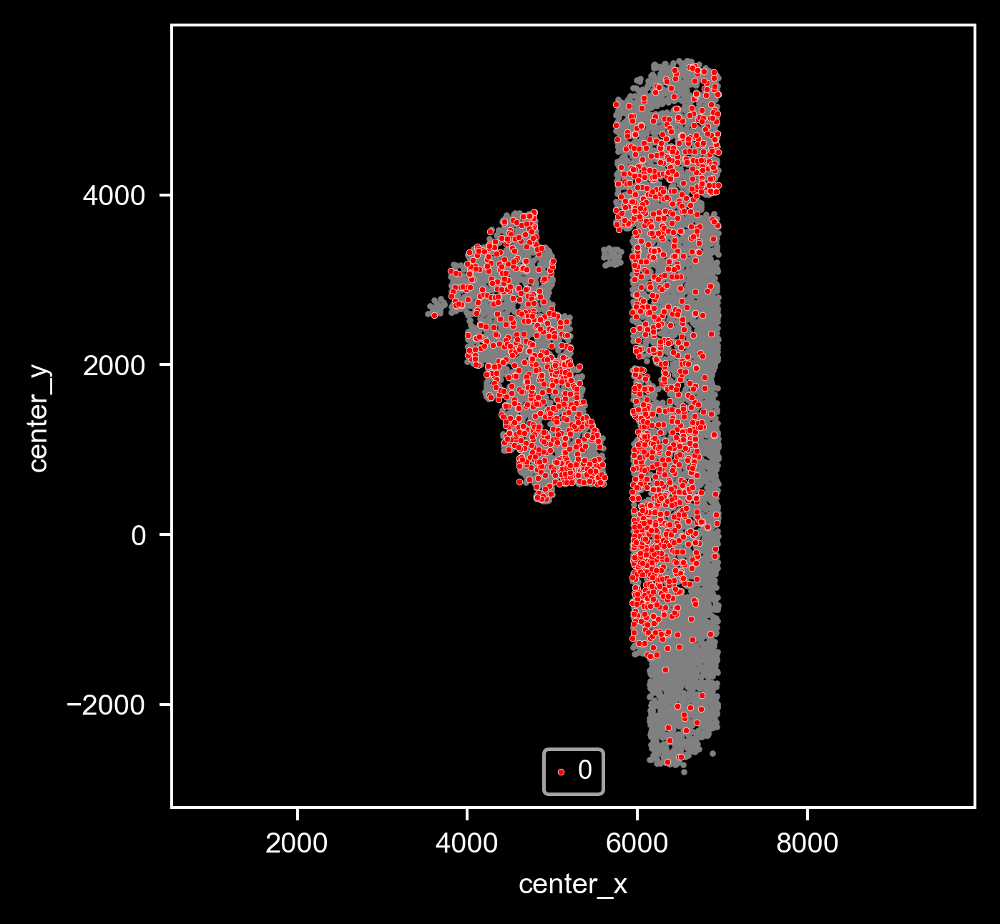

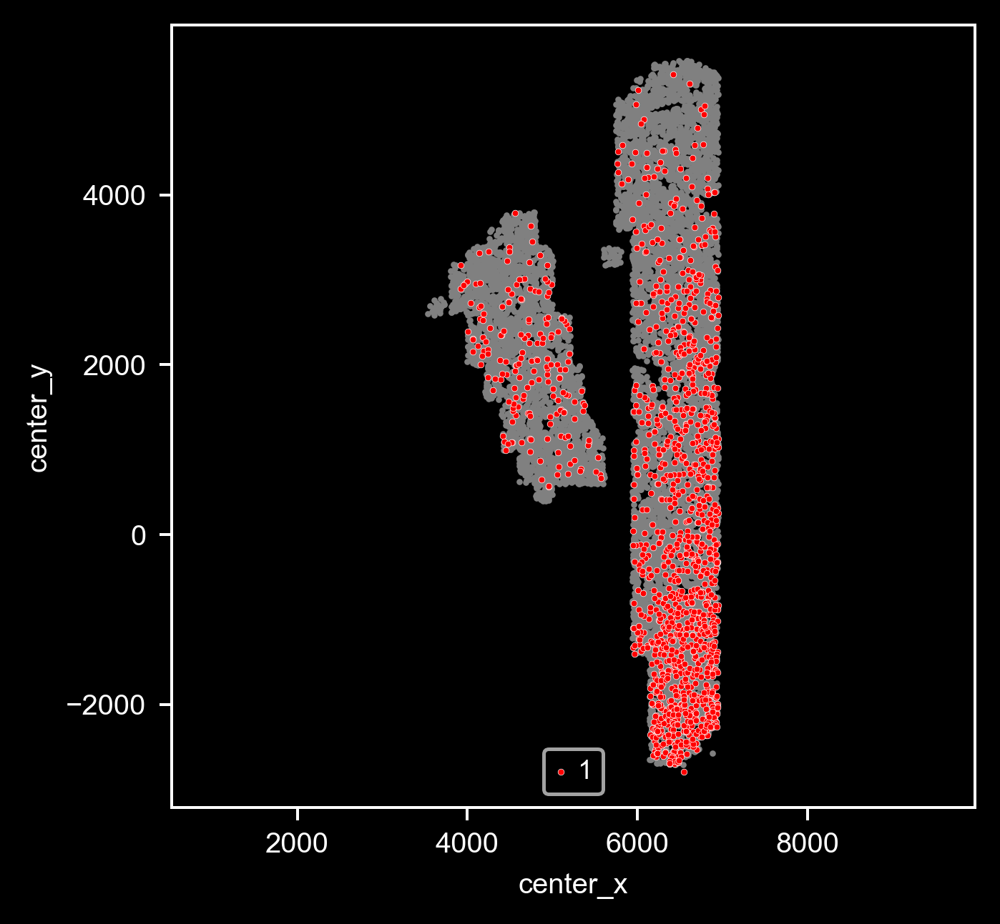

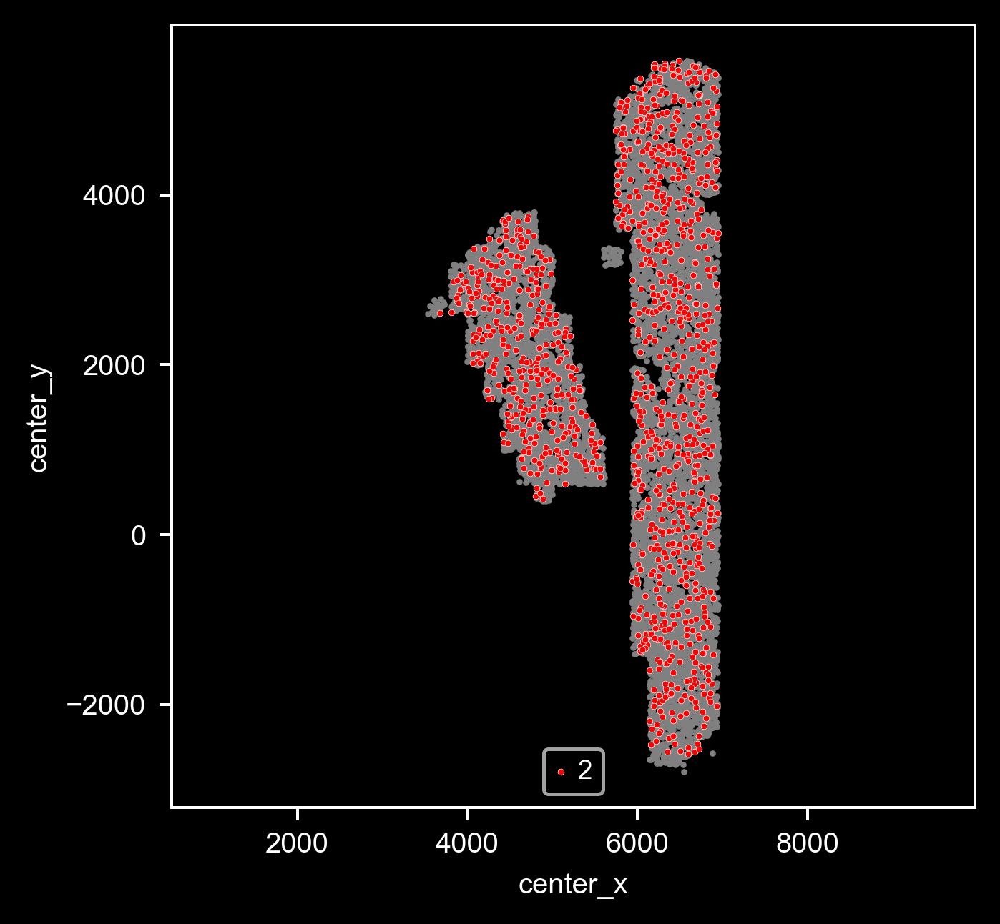

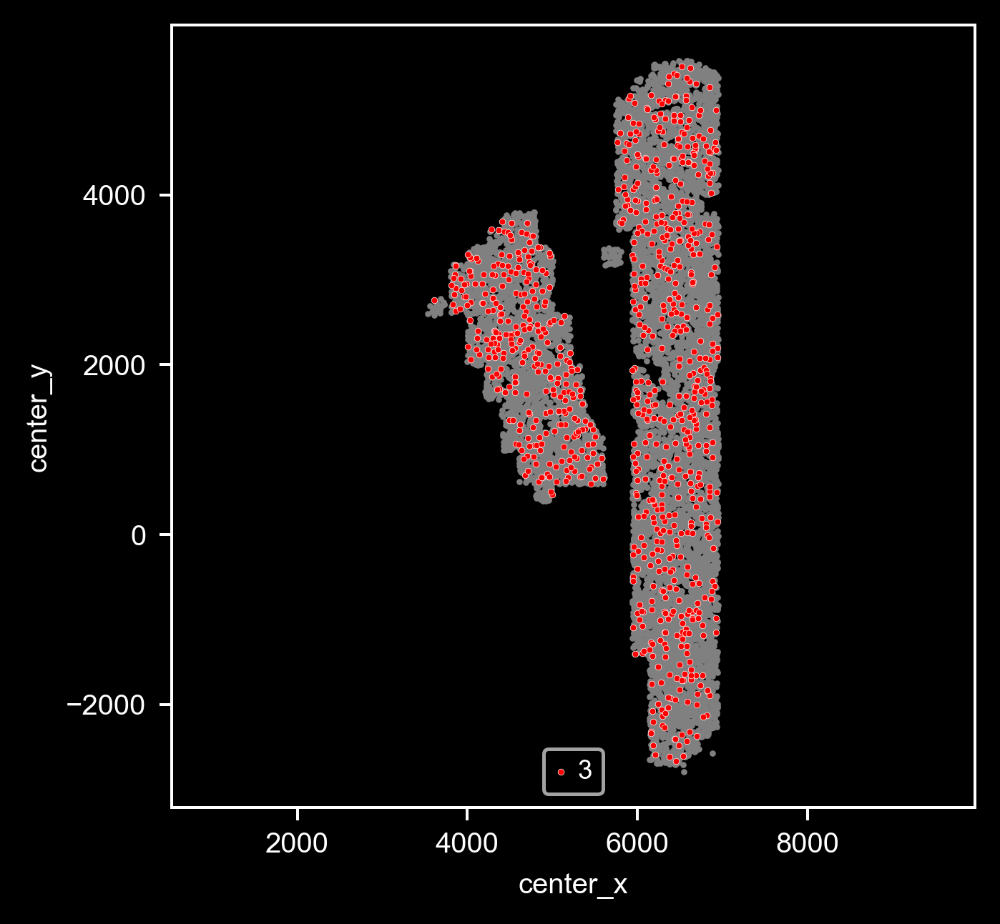

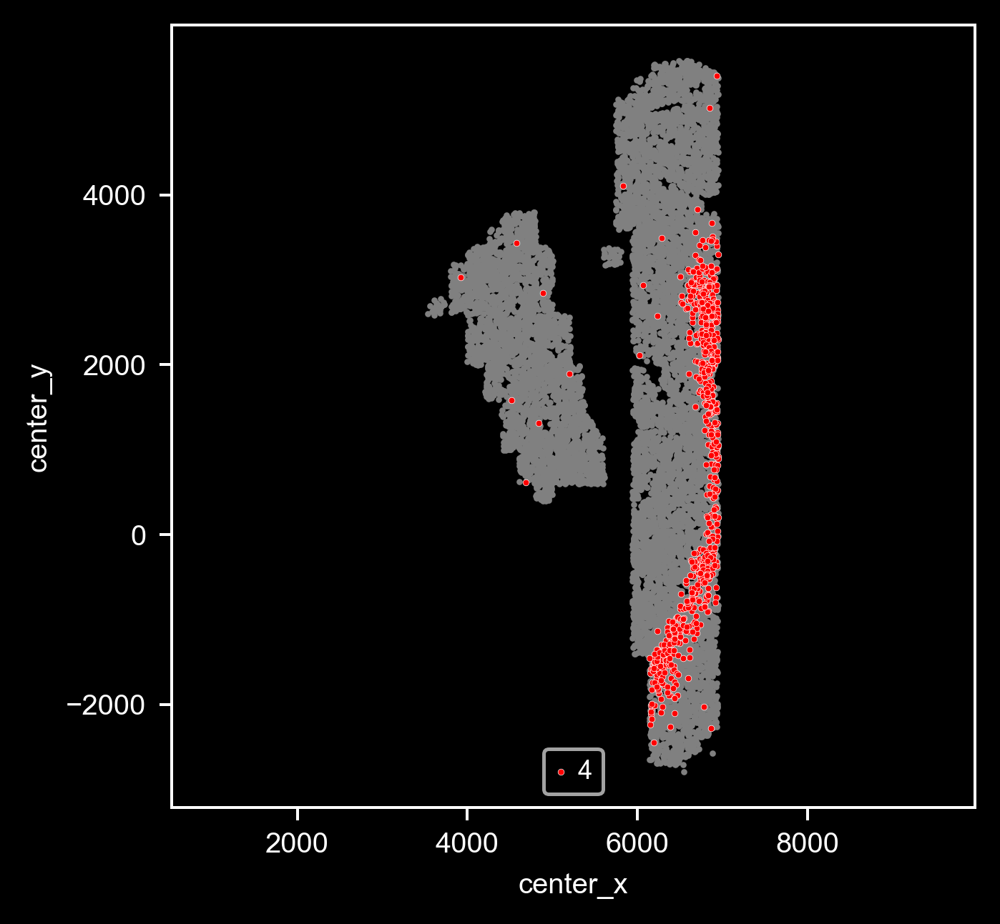

...

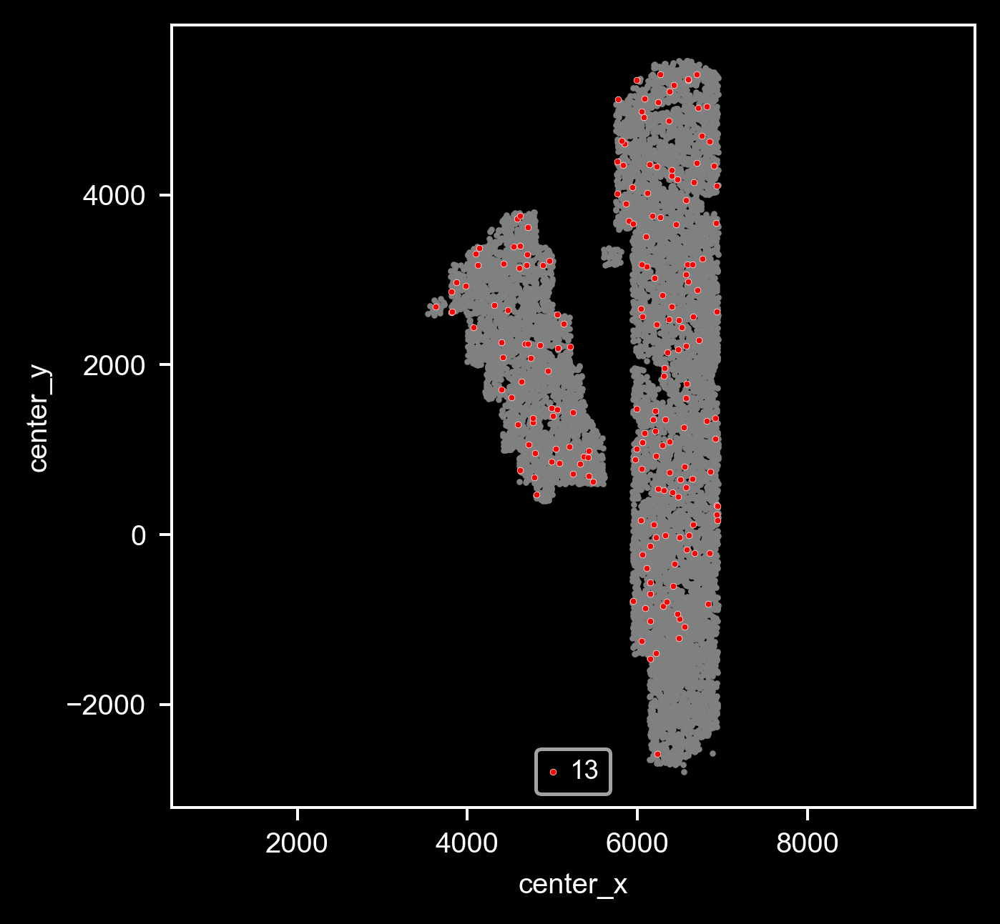

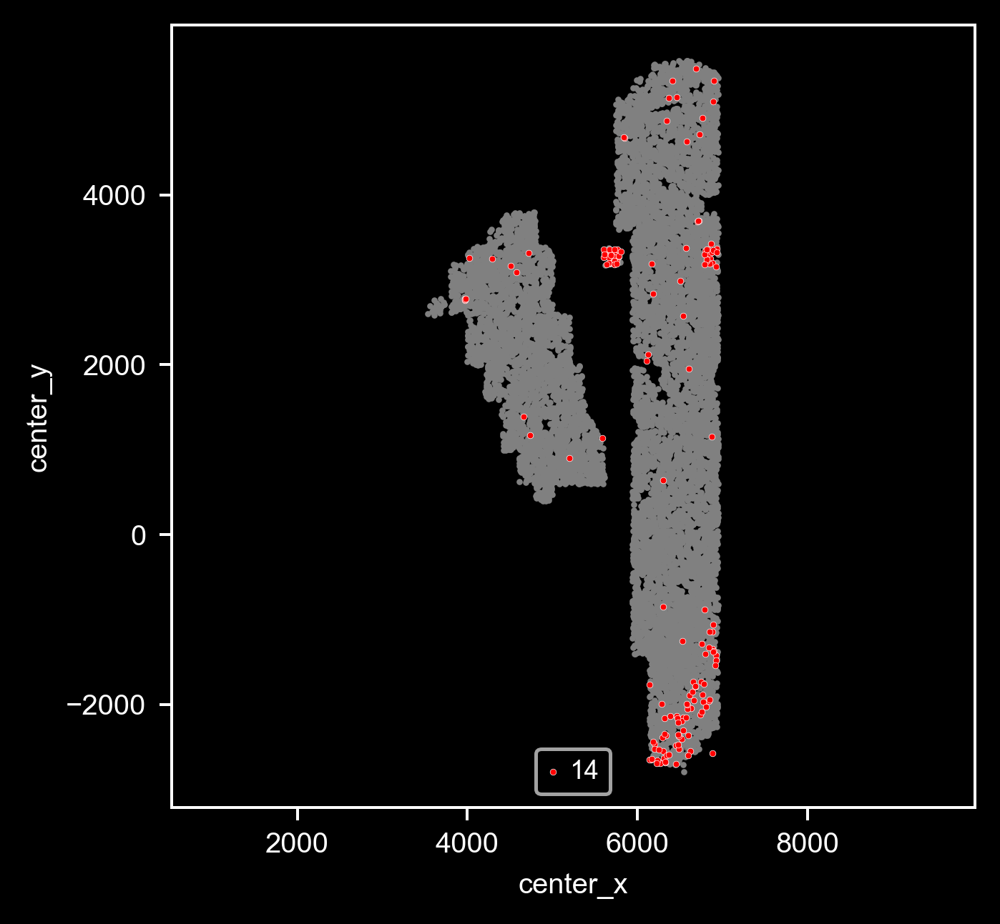

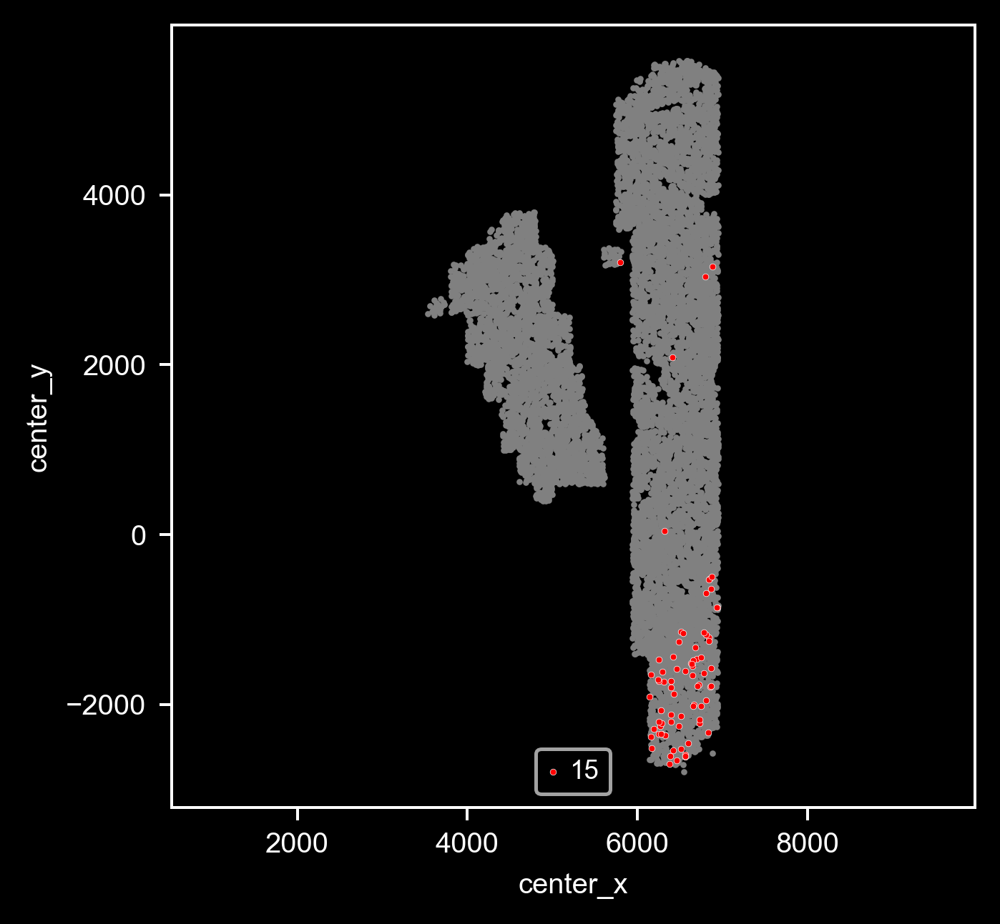

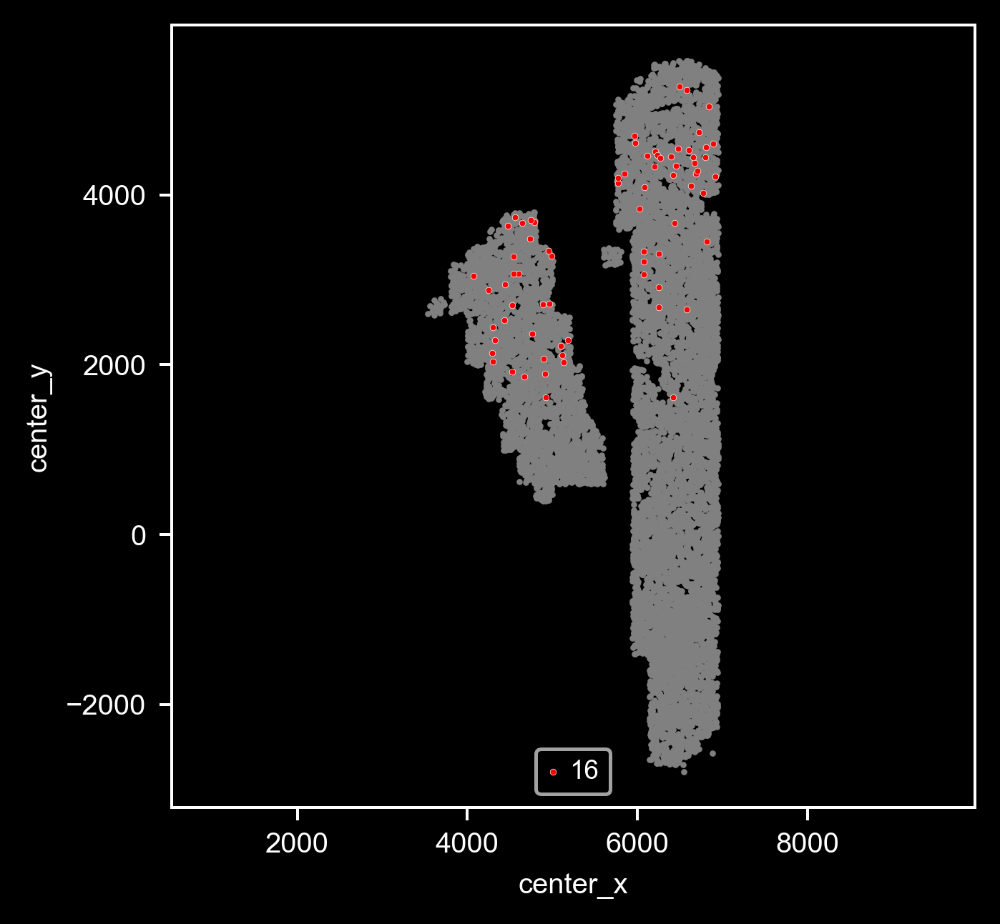

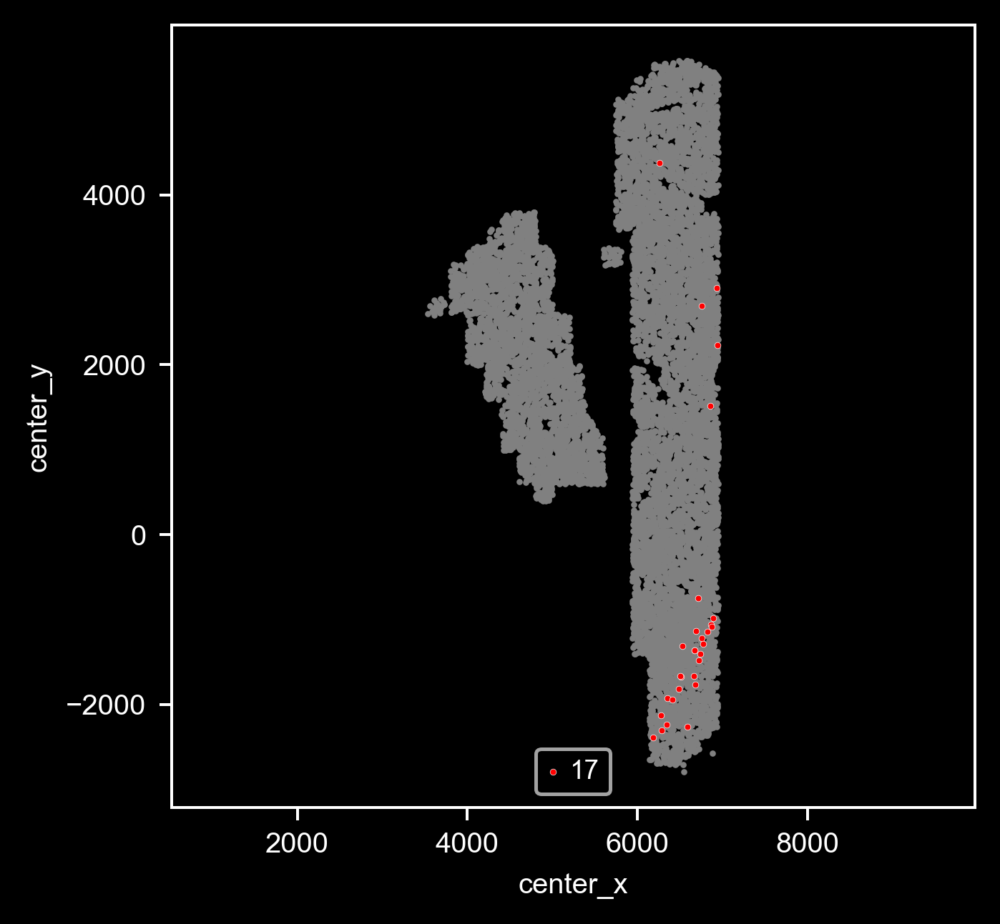

In [66]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=3, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=3, legend=True, label=_class)
    ax.grid(False)
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py

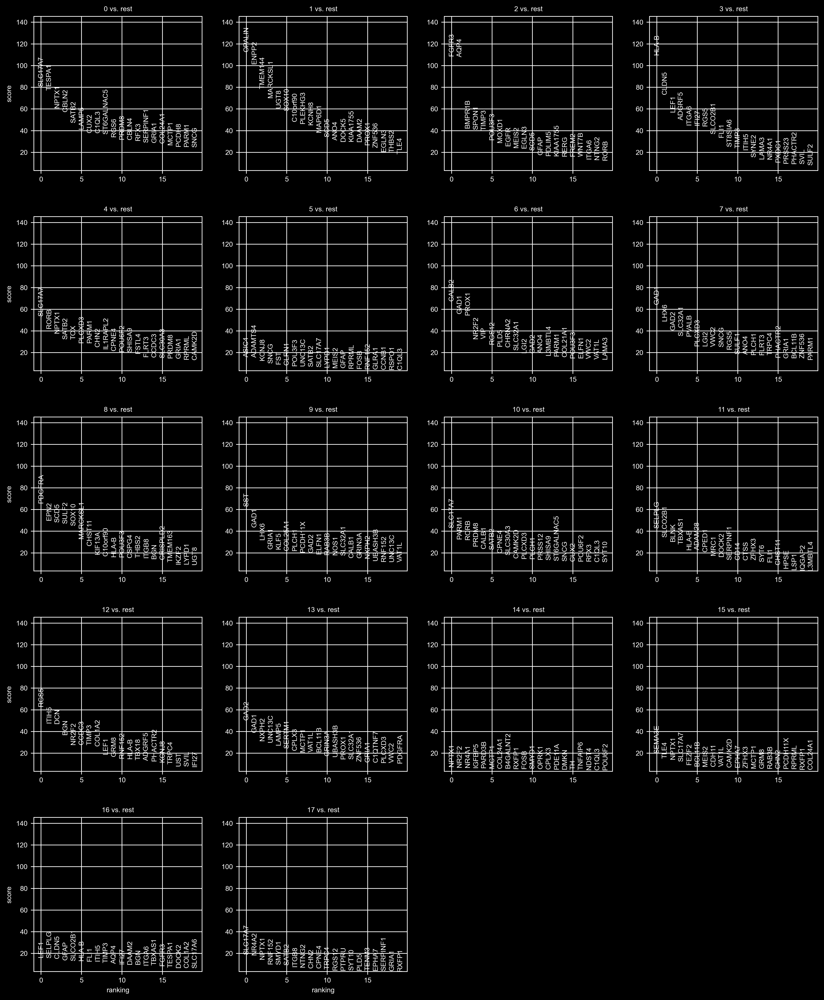

In [69]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

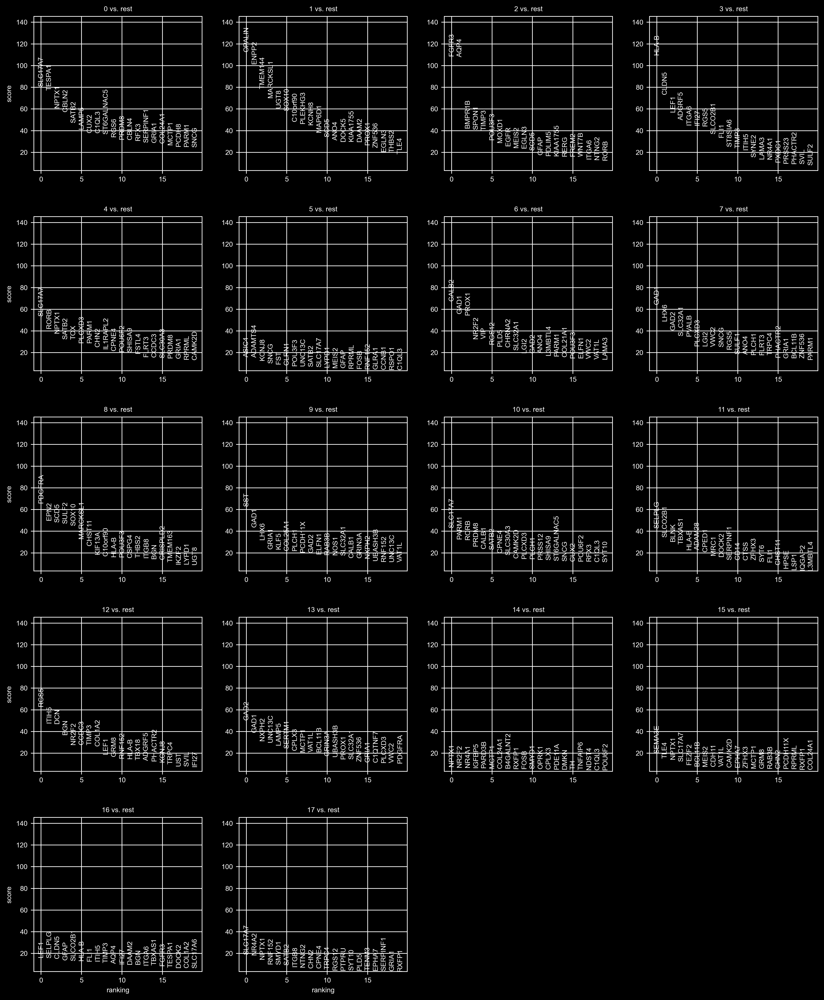

In [70]:

sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [67]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: I:\MERFISH_Analysis\20221003-hMTG_hM1\PostAnalysis\filtered_cluster_data.h5ad


In [68]:
for _cls in np.unique(adata.obs['leiden_cluster']):
    mean_exp = df.iloc[np.where(adata.obs['leiden_cluster']==_cls)[0]].values.mean(0)
    print(_cls, df.columns[np.argsort(mean_exp)[:15]].values)

0 ['FNDC7' 'BARX2' 'CDCP1' 'NNMT' 'LYZL4' 'COL15A1' 'DOCK2' 'OSR1' 'TH'
 'ADAM2' 'COL14A1' 'LTF' 'CCDC80' 'RXFP2' 'CRISPLD2']
1 ['BARX2' 'FNDC7' 'RXFP1' 'LYZL4' 'LTF' 'CHODL' 'SLC17A8' 'SMYD1' 'CDCP1'
 'CCDC80' 'OSR1' 'TH' 'RXFP2' 'COL15A1' 'NPY']
10 ['LYZL4' 'CDCP1' 'FNDC7' 'RXFP2' 'ADAMTS2' 'C1QTNF7' 'ROR1' 'SLCO5A1'
 'COL15A1' 'BARX2' 'LTF' 'CORIN' 'ADAM2' 'NPSR1' 'SLC17A8']
11 ['ADAM2' 'VTN' 'CDCP1' 'BARX2' 'CORIN' 'FNDC7' 'LYZL4' 'NNMT' 'OSR1'
 'SLC17A8' 'RXFP2' 'CHODL' 'TH' 'LTF' 'COL15A1']
12 ['CDCP1' 'SLC17A8' 'BARX2' 'TUNAR' 'SMYD1' 'FNDC7' 'LTF' 'TH' 'ADAM2'
 'NPY' 'DOCK2' 'C1QTNF7' 'NNMT' 'COL14A1' 'COL15A1']
13 ['CDCP1' 'FNDC7' 'ADAM2' 'BARX2' 'SLC17A8' 'NNMT' 'GLRA1' 'COL14A1'
 'ENPP6' 'CHODL' 'OTOF' 'OSR1' 'RXFP2' 'PROK2' 'CCDC80']
14 ['CORIN' 'SLC17A8' 'IGFBP6' 'VTN' 'LYZL4' 'CHODL' 'LTF' 'COL15A1' 'CCDC80'
 'TRPC6' 'NNMT' 'RXFP2' 'PROK2' 'BARX2' 'ADAMTS2']
15 ['CD52' 'LTF' 'HPSE' 'COL25A1' 'NXPH2' 'SEMA3E' 'OPRK1' 'OTOF' 'OSR1'
 'NNMT' 'FNDC7' 'LYZL4' 'TBXAS1' 'ANKFN1' 

In [33]:
adata.obs.loc[adata.obs['leiden']=='18']

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes_by_counts,total_counts,leiden,leiden_cluster
Unnamed: 0,,,,,,,,,,,,
103962799243076310649488273664106353149,33,414.325597,6130.813907,232.560005,6123.513107,6138.114708,228.661205,236.458805,34,45.0,18,18
106819022347023297224500555724939425425,33,673.939306,5966.977903,237.960005,5961.621103,5972.334703,233.305205,242.614805,36,54.0,18,18
111575946788079072044602037715092256732,33,712.577358,6053.917905,278.406006,6048.669105,6059.166706,273.697206,283.114806,20,29.0,18,18
113175809681466403876959558301812744964,33,1692.575958,6134.377907,263.772006,6125.781107,6142.974708,256.093205,271.450806,98,163.0,18,18
121501082368986687701562187884649475288,33,1250.550459,6115.531907,374.688008,6108.717107,6122.346707,367.765208,381.610809,49,91.0,18,18
130175076080861834463354306522715346036,33,856.836435,5986.849904,238.716005,5981.385103,5992.314704,233.521205,243.910805,30,42.0,18,18
13540602008736351854589682995698517071,33,865.045908,6063.097906,296.334006,6057.309105,6068.886706,290.329206,302.338807,25,31.0,18,18
160543017559284326907480947220982643649,33,496.964925,6001.321904,210.474004,5995.533104,6007.110704,205.657204,215.290804,28,35.0,18,18
172810927425917504821543775630738306420,33,831.069258,5992.141904,214.200004,5987.001104,5997.282704,206.521204,221.878804,21,29.0,18,18


In [26]:
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,103088401228109927475074688049978924760,0,1271.411641,5817.197904,3639.148051,5810.437104,5823.958705,3632.657250,3645.638851
1,103187128370877406556202034980280637905,0,184.880825,5874.599906,3621.004050,5871.025106,5878.174706,3617.753250,3624.254850
2,107382755695748422524789909662624872752,0,537.531735,5903.057907,3695.956052,5898.349107,5907.766707,3691.841252,3700.070852
3,108360503512295725899635980343881792618,0,1744.170032,5915.045907,3666.688051,5908.069107,5922.022707,3658.037251,3675.338852
4,110593639130892658922237593901786992908,0,1106.420620,5877.029906,3752.872054,5869.189106,5884.870706,3745.625253,3760.118854
...,...,...,...,...,...,...,...,...,...
8105,91086315070624527700379936027829075920,117,1055.431092,6418.979904,-1204.969950,6413.569104,6424.390705,-1212.054751,-1197.885150
8106,92144363042377391183639597280735717764,117,147.586233,6351.587903,-1167.871950,6347.797103,6355.378703,-1169.826750,-1165.917149
8107,92683205808791220311609288694350875960,117,1024.625183,6426.809905,-1171.759950,6421.021105,6432.598705,-1178.250750,-1165.269149
8108,94775293697877336927950761408583299964,117,13.092724,6344.351903,-1114.141948,6343.045103,6345.658703,-1115.286748,-1112.997148
